In [5]:
import requests
from requests.auth import HTTPBasicAuth
import os
import h5py
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt

In [13]:
# Define Earthdata credentials
username = 'username'
password = 'password'


# Function to search for ICESat-2 granules
def search_granules(short_name, version, start_date, end_date, bounding_box, page_size=100, page_num=1):
    url = 'https://cmr.earthdata.nasa.gov/search/granules.json'
    params = {
        'short_name': short_name,
        'version': version,
        'temporal': f'{start_date}T00:00:00Z,{end_date}T23:59:59Z',
        'bounding_box': bounding_box,
        'page_size': page_size,
        'page_num': page_num
    }
    response = requests.get(url, params=params, auth=HTTPBasicAuth(username, password))
    if response.status_code == 200:
        return response.json().get('feed', {}).get('entry', [])
    else:
        print(f"Failed to retrieve data. Status code: {response.status_code}")
        return []

# Function to download granules
def download_granules(granules, output_directory='downloaded_data'):
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
    for granule in granules:
        granule_url = next(link['href'] for link in granule['links'] if 'data' in link['rel'])
        granule_id = granule['producer_granule_id']
        granule_response = requests.get(granule_url, auth=HTTPBasicAuth(username, password))
        if granule_response.status_code == 200:
            output_path = os.path.join(output_directory, f'{granule_id}.h5')
            with open(output_path, 'wb') as f:
                f.write(granule_response.content)
            print(f"Downloaded {granule_id}.h5 to {output_path}")
        else:
            print(f"Failed to download {granule_id}. Status code: {granule_response.status_code}")

# Search for ICESat-2 ATL03 granules
granules = search_granules(
    short_name='ATL03',
    version='005',
    start_date='2022-01-01',
    end_date='2022-01-31',
    bounding_box='-180,-90,180,90'
)

# Download the granules
if granules:
    download_granules(granules)
else:
    print("No granules found.")

Failed to retrieve data. Status code: 401
No granules found.


In [14]:


# latlon_dict has the sitename_id as the key, and the associated value is a tuple of (lat,lon)
latlon_dict = {'BART': (44.063889, -71.287375), 'HARV': (42.53691, -72.17265), 'HOPB': (42.471941, -72.329526), 'BLAN': (39.033698, -78.041788),
 'LEWI': (39.095637, -77.983216), 'POSE': (38.89431, -78.147258), 'SCBI': (38.892925, -78.139494), 'SERC': (38.890131, -76.560014),
 'BARC': (29.675982, -82.008414), 'DSNY': (28.12505, -81.43619), 'FLNT': (31.185424, -84.437403), 'JERC': (31.194839, -84.468623),
 'OSBS': (29.689282, -81.993431), 'SUGG': (29.68778, -82.017745), 'CUPE': (18.11352, -66.98676), 'GUAN': (17.96955, -66.8687),
 'GUIL': (18.17406, -66.79868), 'LAJA': (18.021261, -67.076889), 'CRAM': (46.209675, -89.473688), 'LIRO': (45.998269, -89.704767),
 'STEI': (45.50894, -89.58637), 'TREE': (45.49369, -89.58571), 'UNDE': (46.23391, -89.537254), 'KING': (39.105061, -96.603829),
 'KONA': (39.110446, -96.612935), 'KONZ': (39.100774, -96.563075), 'MCDI': (38.945861, -96.443022), 'UKFS': (39.040431, -95.19215),
 'GRSM': (35.68896, -83.50195), 'LECO': (35.690428, -83.50379), 'MLBS': (37.378314, -80.524847), 'ORNL': (35.964128, -84.282588),
 'WALK': (35.957378, -84.279251), 'BLWA': (32.541529, -87.798151), 'DELA': (32.541727, -87.803877), 'LENO': (31.853861, -88.161181),
 'MAYF': (32.960365, -87.407688), 'TALL': (32.95047, -87.393259), 'TOMB': (31.853431, -88.158872), 'DCFS': (47.16165, -99.10656),
 'NOGP': (46.76972, -100.91535), 'PRLA': (47.15909, -99.11388), 'PRPO': (47.129839, -99.253147), 'WOOD': (47.1282, -99.241334),
 'ARIK': (39.758206, -102.44715), 'CPER': (40.815536, -104.74559), 'RMNP': (40.275903, -105.54596), 'STER': (40.461894, -103.02929),
 'BLUE': (34.444218, -96.624201), 'CLBJ': (33.40123, -97.57), 'OAES': (35.410599, -99.058779), 'PRIN': (33.378517, -97.782312),
 'BLDE': (44.95011, -110.58715), 'YELL': (44.95348, -110.53914), 'COMO': (40.034962, -105.54416), 'MOAB': (38.248283, -109.38827),
 'NIWO': (40.05425, -105.58237), 'WLOU': (39.891366, -105.9154), 'JORN': (32.590694, -106.84254), 'SRER': (31.91068, -110.83549),
 'SYCA': (33.750993, -111.50809), 'ONAQ': (40.177599, -112.45245), 'REDB': (40.783934, -111.79789), 'ABBY': (45.762439, -122.33032),
 'MART': (45.790835, -121.93379), 'MCRA': (44.259598, -122.16555), 'WREF': (45.82049, -121.95191), 'BIGC': (37.059719, -119.25755),
 'SJER': (37.10878, -119.73228), 'SOAP': (37.03337, -119.26219), 'TEAK': (37.00583, -119.00602), 'TECR': (36.955931, -119.02736),
 'BARR': (71.28241, -156.61936), 'OKSR': (68.669753, -149.14302), 'TOOK': (68.630692, -149.61064), 'TOOL': (68.66109, -149.37047),
 'BONA': (65.15401, -147.50258), 'CARI': (65.153224, -147.50397), 'DEJU': (63.88112, -145.75136),
 'HEAL': (63.875798, -149.21335), 'PUUM': (19.55309, -155.31731)}

deju_coords = latlon_dict['DEJU']

# Path to the .h5 file
h5_file_path = 'path_to_your_file.h5'

# Open the .h5 file
with h5py.File(h5_file_path, 'r') as f:
    # Assuming 'latitude' and 'longitude' datasets are available in the .h5 file
    latitudes = f['latitude'][:]
    longitudes = f['longitude'][:]
    
    # Find the index of the closest point
    distance = np.sqrt((latitudes - deju_coords[0])**2 + (longitudes - deju_coords[1])**2)
    closest_point_idx = np.argmin(distance)
    
    # Access the data for the closest point
    # Assuming 'data' is the dataset containing the data of interest
    data = f['data'][closest_point_idx]
    
    print(f"Data for DEJU (closest point): {data}")

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'path_to_your_file.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [15]:
# Path to your .h5 file
h5_file_path = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA/'
file_name = 'processed_ATL08_20190110205028_02050203_005_01.h5'
# file_name = 'processed_ATL08_20181025130455_04110105_005_01.h5'

# Join the directory path and file name
full_path = os.path.join(h5_file_path, file_name)

def print_structure(name, obj):
    if isinstance(obj, h5py.Dataset):
        print(f"Dataset: {name} - Shape: {obj.shape}, Data type: {obj.dtype}")
    elif isinstance(obj, h5py.Group):
        print(f"Group: {name}")

# Open the .h5 file and access specific datasets
with h5py.File(full_path, 'r') as f:
    # Print full structure of h5 file
    f.visititems(print_structure)

    # Access the 'gt1l/land_segments' group
    if 'gt1l/land_segments' in f:
        land_segments_group_l = f['gt1l/land_segments']
        seg_lat_l = land_segments_group_l['latitude'][:]
        seg_long_l = land_segments_group_l['longitude'][:]
        seg_land_cover_l = land_segments_group_l['segment_landcover'][:]
        
        print("GT1L Land Segment Latitudes:", seg_lat_l)
        print("GT1L Land Segment Longitudes:", seg_long_l)
        print("GT1L Land Segment Land Cover:", seg_land_cover_l)

    # Access the 'gt1l/land_segments/canopy' group
    if 'gt1l/land_segments/canopy' in f:
        canopy_group_l = f['gt1l/land_segments/canopy']
        canopy_segment_cover_l = canopy_group_l['segment_cover'][:]
        print("GT1L Canopy Segment Cover:", canopy_segment_cover_l)

    # Access the 'gt1r/land_segments' group
    if 'gt1r/land_segments' in f:
        land_segments_group_r = f['gt1r/land_segments']
        seg_lat_r = land_segments_group_r['latitude'][:]
        seg_long_r = land_segments_group_r['longitude'][:]
        seg_land_cover_r = land_segments_group_r['segment_landcover'][:]
        
        print("GT1R Land Segment Latitudes:", seg_lat_r)
        print("GT1R Land Segment Longitudes:", seg_long_r)
        print("GT1R Land Segment Land Cover:", seg_land_cover_r)

    # Access the 'gt1r/land_segments/canopy' group
    if 'gt1r/land_segments/canopy' in f:
        canopy_group_r = f['gt1r/land_segments/canopy']
        canopy_segment_cover_r = canopy_group_r['segment_cover'][:]
        print("GT1R Canopy Segment Cover:", canopy_segment_cover_r)

Group: METADATA
Group: METADATA/AcquisitionInformation
Group: METADATA/AcquisitionInformation/lidar
Group: METADATA/AcquisitionInformation/lidarDocument
Group: METADATA/AcquisitionInformation/platform
Group: METADATA/AcquisitionInformation/platformDocument
Group: METADATA/DataQuality
Group: METADATA/DataQuality/CompletenessOmission
Group: METADATA/DataQuality/DomainConsistency
Group: METADATA/DatasetIdentification
Group: METADATA/Extent
Group: METADATA/Lineage
Group: METADATA/Lineage/ANC06-01
Group: METADATA/Lineage/ANC06-02
Group: METADATA/Lineage/ANC06-03
Group: METADATA/Lineage/ANC14
Group: METADATA/Lineage/ANC18
Group: METADATA/Lineage/ANC19
Group: METADATA/Lineage/ANC25-08
Group: METADATA/Lineage/ANC26-08
Group: METADATA/Lineage/ANC28
Group: METADATA/Lineage/ANC33
Group: METADATA/Lineage/ANC34
Group: METADATA/Lineage/ANC36-08
Group: METADATA/Lineage/ANC38-08
Group: METADATA/Lineage/ANC46
Group: METADATA/Lineage/ATL03
Group: METADATA/Lineage/ATL09
Group: METADATA/Lineage/Control
Gr

In [16]:
# Path to your .h5 file
h5_file_path = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA/'

# Use glob to find all .h5 files in the folder
file_paths = glob.glob(os.path.join(h5_file_path, '*.h5'))

# Function to recursively print the structure of the HDF5 file
def print_structure(name, obj):
    if isinstance(obj, h5py.Group):
        print(f"Group: {name}")
        for key in obj.keys():
            print(f"  {key}: {obj[key]}")
    elif isinstance(obj, h5py.Dataset):
        print(f"Dataset: {name} - Shape: {obj.shape}, Data type: {obj.dtype}")

# Initialize lists to store data from all files, separated by group
all_latitudes_gt1l = []
all_longitudes_gt1l = []
all_land_cover_gt1l = []
all_canopy_segment_cover_gt1l = []

all_latitudes_gt1r = []
all_longitudes_gt1r = []
all_land_cover_gt1r = []
all_canopy_segment_cover_gt1r = []

# Helper function to extract data from a group
def extract_data_from_group(group, prefix):
    if 'latitude' in group:
        lat = group['latitude'][:]
        if prefix == 'gt1l':
            all_latitudes_gt1l.append(lat)
        elif prefix == 'gt1r':
            all_latitudes_gt1r.append(lat)
    if 'longitude' in group:
        lon = group['longitude'][:]
        if prefix == 'gt1l':
            all_longitudes_gt1l.append(lon)
        elif prefix == 'gt1r':
            all_longitudes_gt1r.append(lon)
    if 'segment_landcover' in group:
        land_cover = group['segment_landcover'][:]
        if prefix == 'gt1l':
            all_land_cover_gt1l.append(land_cover)
        elif prefix == 'gt1r':
            all_land_cover_gt1r.append(land_cover)
    if 'canopy' in group:
        canopy_group = group['canopy']
        if 'segment_cover' in canopy_group:
            canopy_segment_cover = canopy_group['segment_cover'][:]
            if prefix == 'gt1l':
                all_canopy_segment_cover_gt1l.append(canopy_segment_cover)
            elif prefix == 'gt1r':
                all_canopy_segment_cover_gt1r.append(canopy_segment_cover)

# Function to process each .h5 file
def process_file(file_path):
    with h5py.File(file_path, 'r') as f:
        # Process 'gt1l' group
        if 'gt1l/land_segments' in f:
            land_segments_group = f['gt1l/land_segments']
            extract_data_from_group(land_segments_group, 'gt1l')
        
        # Process 'gt1r' group
        if 'gt1r/land_segments' in f:
            land_segments_group = f['gt1r/land_segments']
            extract_data_from_group(land_segments_group, 'gt1r')

# Process each file
for file_path in file_paths:
    process_file(file_path)

# Convert lists to numpy arrays
latitudes_gt1l_array = np.concatenate(all_latitudes_gt1l) if all_latitudes_gt1l else np.array([])
longitudes_gt1l_array = np.concatenate(all_longitudes_gt1l) if all_longitudes_gt1l else np.array([])
land_cover_gt1l_array = np.concatenate(all_land_cover_gt1l) if all_land_cover_gt1l else np.array([])
canopy_segment_cover_gt1l_array = np.concatenate(all_canopy_segment_cover_gt1l) if all_canopy_segment_cover_gt1l else np.array([])

latitudes_gt1r_array = np.concatenate(all_latitudes_gt1r) if all_latitudes_gt1r else np.array([])
longitudes_gt1r_array = np.concatenate(all_longitudes_gt1r) if all_longitudes_gt1r else np.array([])
land_cover_gt1r_array = np.concatenate(all_land_cover_gt1r) if all_land_cover_gt1r else np.array([])
canopy_segment_cover_gt1r_array = np.concatenate(all_canopy_segment_cover_gt1r) if all_canopy_segment_cover_gt1r else np.array([])

# Print the shapes of the resulting arrays
print("GT1L Latitudes array shape:", latitudes_gt1l_array.shape)
print("GT1L Longitudes array shape:", longitudes_gt1l_array.shape)
print("GT1L Land Cover array shape:", land_cover_gt1l_array.shape)
print("GT1L Canopy Segment Cover array shape:", canopy_segment_cover_gt1l_array.shape)

print("GT1R Latitudes array shape:", latitudes_gt1r_array.shape)
print("GT1R Longitudes array shape:", longitudes_gt1r_array.shape)
print("GT1R Land Cover array shape:", land_cover_gt1r_array.shape)
print("GT1R Canopy Segment Cover array shape:", canopy_segment_cover_gt1r_array.shape)

# Function to find all indices of duplicate coordinates
def find_duplicates(latitudes, longitudes):
    seen = {}
    duplicates = []
    duplicate_indices = []
    for idx, (lat, lon) in enumerate(zip(latitudes, longitudes)):
        key = (lat, lon)
        if key in seen:
            duplicates.append(key)
            duplicate_indices.append(idx)
            duplicate_indices.extend(seen[key])
        else:
            seen[key] = [idx]
    return duplicates, duplicate_indices

# Find duplicates for gt1l and gt1r
duplicates_gt1l, duplicate_indices_gt1l = find_duplicates(latitudes_gt1l_array, longitudes_gt1l_array)
duplicates_gt1r, duplicate_indices_gt1r = find_duplicates(latitudes_gt1r_array, longitudes_gt1r_array)

# Create DataFrame for gt1l duplicates
duplicates_df_gt1l = pd.DataFrame({
    'Latitude_gt1l': latitudes_gt1l_array[duplicate_indices_gt1l],
    'Longitude_gt1l': longitudes_gt1l_array[duplicate_indices_gt1l],
    'Land Cover_gt1l': land_cover_gt1l_array[duplicate_indices_gt1l],
    'Canopy Segment Cover_gt1l': canopy_segment_cover_gt1l_array[duplicate_indices_gt1l]
})

# Create DataFrame for gt1r duplicates
duplicates_df_gt1r = pd.DataFrame({
    'Latitude_gt1r': latitudes_gt1r_array[duplicate_indices_gt1r],
    'Longitude_gt1r': longitudes_gt1r_array[duplicate_indices_gt1r],
    'Land Cover_gt1r': land_cover_gt1r_array[duplicate_indices_gt1r],
    'Canopy Segment Cover_gt1r': canopy_segment_cover_gt1r_array[duplicate_indices_gt1r]
})

# Merge both DataFrames to have a unified view
merged_duplicates_df = pd.concat([duplicates_df_gt1l, duplicates_df_gt1r], axis=1)

# Optionally, save to CSV
merged_duplicates_df.to_csv('duplicates_combined.csv', index=False)

# Function to remove duplicates and keep associated values
def remove_duplicates(latitudes, longitudes, land_cover, canopy_segment_cover):
    seen = set()
    unique_latitudes = []
    unique_longitudes = []
    unique_land_cover = []
    unique_canopy_segment_cover = []
    
    for lat, lon, lc, csc in zip(latitudes, longitudes, land_cover, canopy_segment_cover):
        if (lat, lon) not in seen:
            seen.add((lat, lon))
            unique_latitudes.append(lat)
            unique_longitudes.append(lon)
            unique_land_cover.append(lc)
            unique_canopy_segment_cover.append(csc)
    
    return np.array(unique_latitudes), np.array(unique_longitudes), np.array(unique_land_cover), np.array(unique_canopy_segment_cover)

# Remove duplicates for GT1L and GT1R
unique_latitudes_gt1l, unique_longitudes_gt1l, unique_land_cover_gt1l, unique_canopy_segment_cover_gt1l = remove_duplicates(
    latitudes_gt1l_array, longitudes_gt1l_array, land_cover_gt1l_array, canopy_segment_cover_gt1l_array
)
unique_latitudes_gt1r, unique_longitudes_gt1r, unique_land_cover_gt1r, unique_canopy_segment_cover_gt1r = remove_duplicates(
    latitudes_gt1r_array, longitudes_gt1r_array, land_cover_gt1r_array, canopy_segment_cover_gt1r_array
)

# Merge unique arrays
merged_latitudes = np.concatenate((unique_latitudes_gt1l, unique_latitudes_gt1r))
merged_longitudes = np.concatenate((unique_longitudes_gt1l, unique_longitudes_gt1r))
merged_land_cover = np.concatenate((unique_land_cover_gt1l, unique_land_cover_gt1r))
merged_canopy_segment_cover = np.concatenate((unique_canopy_segment_cover_gt1l, unique_canopy_segment_cover_gt1r))

# Create a DataFrame
df_merged = pd.DataFrame({
    'Latitude': merged_latitudes,
    'Longitude': merged_longitudes,
    'Land Cover': merged_land_cover,
    'Canopy Segment Cover': merged_canopy_segment_cover
})

# Save DataFrame to CSV
df_merged.to_csv('unique_coordinates_with_values.csv', index=False)

print("Unique coordinates and values saved to 'unique_coordinates_with_values.csv'")

GT1L Latitudes array shape: (8883,)
GT1L Longitudes array shape: (8883,)
GT1L Land Cover array shape: (8883,)
GT1L Canopy Segment Cover array shape: (8883,)
GT1R Latitudes array shape: (8481,)
GT1R Longitudes array shape: (8481,)
GT1R Land Cover array shape: (8481,)
GT1R Canopy Segment Cover array shape: (8481,)
Unique coordinates and values saved to 'unique_coordinates_with_values.csv'


In [17]:
def print_structure(name, obj):
    if isinstance(obj, h5py.Dataset):
        print(f"Dataset: {name} - Shape: {obj.shape}, Data type: {obj.dtype}")
    elif isinstance(obj, h5py.Group):
        print(f"Group: {name}")
        # Recursively print the structure of the group
        for key, item in obj.items():
            print_structure(f"{name}/{key}", item)

def explore_hdf5_file(file_path):
    with h5py.File(file_path, 'r') as f:
        # Print the structure of the entire HDF5 file
        for key, item in f.items():
            print_structure(key, item)

def output_raw_h5_files(directory_path):
    # Function to print the structure of HDF5 files
    def print_structure(name, obj):
        if isinstance(obj, h5py.Dataset):
            print(f"Dataset: {name} - Shape: {obj.shape}, Data type: {obj.dtype}")
        elif isinstance(obj, h5py.Group):
            print(f"Group: {name}")

    # Walk through the directory recursively
    for root, dirs, files in os.walk(directory_path):
        for file_name in files:
            if file_name.endswith('.h5'):
                file_path = os.path.join(root, file_name)
                print(f"\nFile: {file_path}")
                
                # Open the HDF5 file and print its structure
                with h5py.File(file_path, 'r') as f:
                    f.visititems(print_structure)

In [7]:
def extract_data_from_file(file_path):
    # Initialize lists to store data
    data_list = []

    # Extract filename from file_path
    file_name = os.path.basename(file_path)

    # Open the HDF5 file
    with h5py.File(file_path, 'r') as f:
        # Iterate over all beam groups
        for beam in ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']:
            if f"{beam}/land_segments" in f:
                # Extract relevant data
                segment_ids = f[f"{beam}/land_segments/segment_id_beg"][:]
                latitudes = f[f"{beam}/land_segments/latitude"][:]
                longitudes = f[f"{beam}/land_segments/longitude"][:]
                segment_landcover = f[f"{beam}/land_segments/segment_landcover"][:]
                segment_cover = f[f"{beam}/land_segments/canopy/segment_cover"][:]

                for i, segment_id in enumerate(segment_ids):
                    data_entry = {
                        'file_name': file_name,
                        'beam': beam,
                        'segment_id_beg': segment_id,
                        'latitude': latitudes[i],
                        'longitude': longitudes[i],
                        'segment_landcover': segment_landcover[i],
                        'segment_cover': segment_cover[i]
                    }
                    data_list.append(data_entry)

    # Create a DataFrame from the list
    df = pd.DataFrame(data_list)
    return df

def process_all_files(directory_path, output_csv_path):
    all_data = []

    # Glob all .h5 files in the directory
    h5_files = glob.glob(os.path.join(directory_path, '*.h5'))
    site_var = os.path.basename(os.path.normpath(directory_path))

    for file_path in h5_files:
        data_df = extract_data_from_file(file_path)
        if not data_df.empty:
            all_data.append(data_df)

    # Combine all data into a single DataFrame
    combined_data = pd.concat(all_data, ignore_index=True) if all_data else pd.DataFrame()

    # Print data for verification
    print(site_var)
    print(f"Total entries: {combined_data.shape[0]}")
    print()

    # Create the output directory if it doesn't exist
    os.makedirs(output_csv_path, exist_ok=True)

    # Save to a single CSV file
    last_folder_name = os.path.basename(os.path.normpath(directory_path))
    output_csv = os.path.join(output_csv_path, f'{last_folder_name}_AllData.csv')

    combined_data.to_csv(output_csv, index=False)

def plot_and_save_unique_data(output_csv_path, save_path):
    # Ensure the save directory exists
    os.makedirs(save_path, exist_ok=True)
    
    # Find all _AllData.csv files in the output directory
    all_data_csv_files = glob.glob(os.path.join(output_csv_path, '*_AllData.csv'))

    for csv_file_path in all_data_csv_files:
        # Extract the base name of the file for plotting
        file_name = os.path.basename(csv_file_path)
        base_name = os.path.splitext(file_name)[0]

        # Read the data from the CSV file
        df = pd.read_csv(csv_file_path)

        # Create a new figure for each file
        plt.figure(figsize=(20, 15))
        
        # Plot each beam type with a different color
        beam_colors = {
            'gt1l': 'red',
            'gt1r': 'green',
            'gt2l': 'blue',
            'gt2r': 'purple',
            'gt3l': 'orange',
            'gt3r': 'brown'
        }

        for beam, color in beam_colors.items():
            beam_data = df[df['beam'] == beam]
            plt.scatter(beam_data['longitude'], beam_data['latitude'], color=color, label=beam, alpha=0.6, s=5)

        # Add labels and legend
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.title(f'Lat-Long Plot for {base_name}')
        plt.legend()
        plt.grid(True)

        # Save the plot as a PNG file
        plot_filename = os.path.join(save_path, f'{base_name}_Plot.png')
        plt.savefig(plot_filename)

        # Show the plot inline (optional)
        plt.show()

In [22]:
BONA_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA/'
DEJU_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU/'
WREF_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/WREF/'

HEAL_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/HEAL/'

output_path = 'C:/Users/allen/OneDrive/Desktop/Work/Scripts/small footprint/output/'
save_path = 'C:/Users/allen/OneDrive/Desktop/Work/Scripts/small footprint/plots/'

BONA_cam_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_cam/'
BONA_10km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_10km/'
BONA_50km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_50km/'
BONA_100km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_100km/'

DEJU_cam_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_cam/'
DEJU_10km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU_10km/'
DEJU_50km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU_50km/'
DEJU_100km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU_100km/'


In [19]:
output_raw_h5_files(BONA_folder)


File: C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA/processed_ATL08_20190110205028_02050203_005_01.h5
Group: METADATA
Group: METADATA/AcquisitionInformation
Group: METADATA/AcquisitionInformation/lidar
Group: METADATA/AcquisitionInformation/lidarDocument
Group: METADATA/AcquisitionInformation/platform
Group: METADATA/AcquisitionInformation/platformDocument
Group: METADATA/DataQuality
Group: METADATA/DataQuality/CompletenessOmission
Group: METADATA/DataQuality/DomainConsistency
Group: METADATA/DatasetIdentification
Group: METADATA/Extent
Group: METADATA/Lineage
Group: METADATA/Lineage/ANC06-01
Group: METADATA/Lineage/ANC06-02
Group: METADATA/Lineage/ANC06-03
Group: METADATA/Lineage/ANC14
Group: METADATA/Lineage/ANC18
Group: METADATA/Lineage/ANC19
Group: METADATA/Lineage/ANC25-08
Group: METADATA/Lineage/ANC26-08
Group: METADATA/Lineage/ANC28
Group: METADATA/Lineage/ANC33
Group: METADATA/Lineage/ANC34
Group: METADATA/Lineage/ANC36-08
Group: METADATA/Lineage/ANC38-08
Group: METADA

In [23]:
process_all_files(BONA_cam_folder, output_path)
process_all_files(DEJU_cam_folder, output_path)

BONA_cam
Total entries: 1896

BONA_cam
Total entries: 1896



In [21]:
process_all_files(BONA_folder, output_path)
process_all_files(DEJU_folder, output_path)
process_all_files(WREF_folder, output_path)

process_all_files(BONA_10km_folder, output_path)
process_all_files(BONA_50km_folder, output_path)
process_all_files(BONA_100km_folder, output_path)
process_all_files(DEJU_10km_folder, output_path)
process_all_files(DEJU_50km_folder, output_path)
process_all_files(DEJU_100km_folder, output_path)

BONA
Total entries: 52851

DEJU
Total entries: 65486

WREF
Total entries: 14017

BONA_10km
Total entries: 20180

BONA_50km
Total entries: 671947

BONA_100km
Total entries: 2743619

DEJU_10km
Total entries: 20596

DEJU_50km
Total entries: 637299

DEJU_100km
Total entries: 2528658



C:\Users\allen\AppData\Local\Temp\ipykernel_1340\4187645451.py:148: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(plot_filename)
C:\Users\allen\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


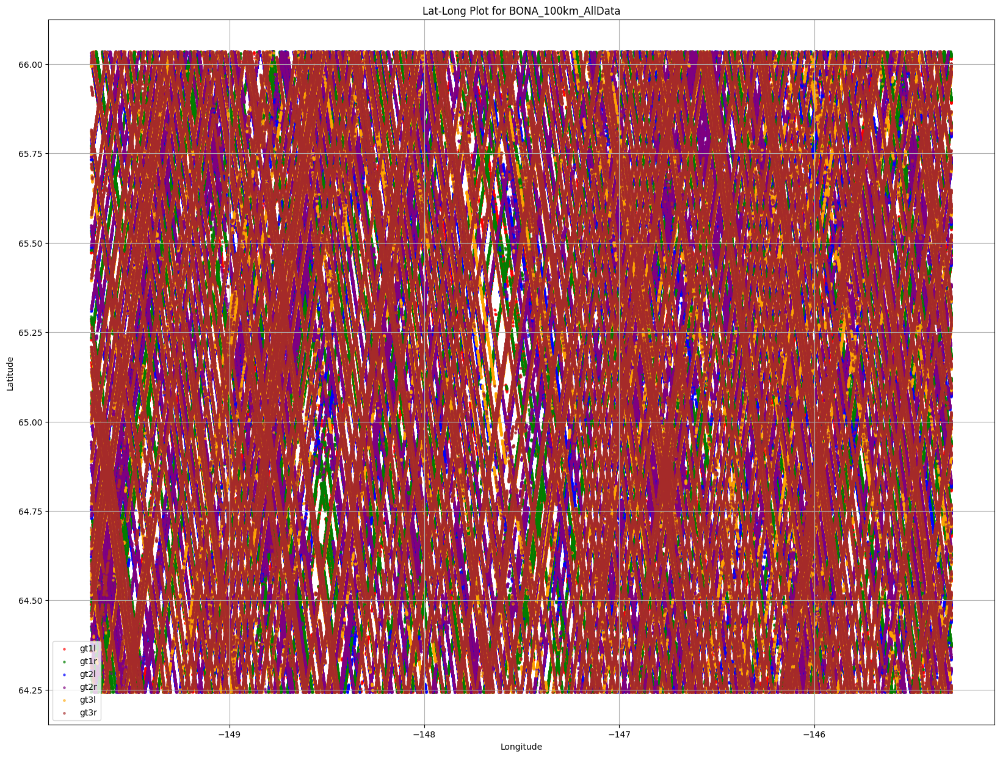

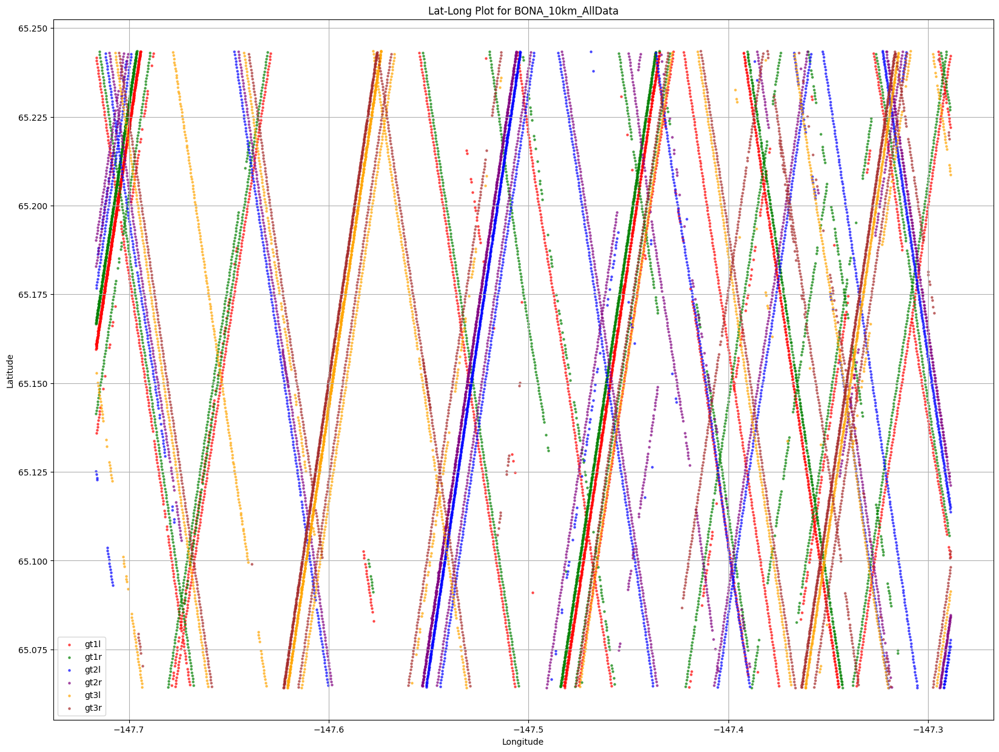

C:\Users\allen\AppData\Local\Temp\ipykernel_1340\4187645451.py:148: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(plot_filename)
C:\Users\allen\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


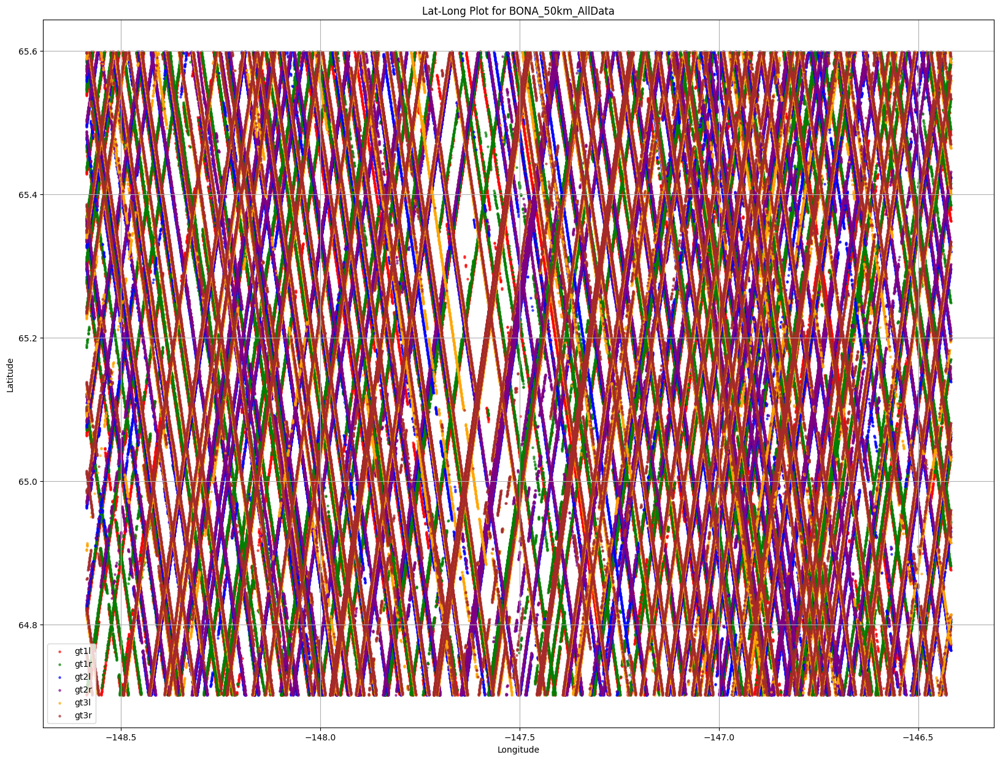

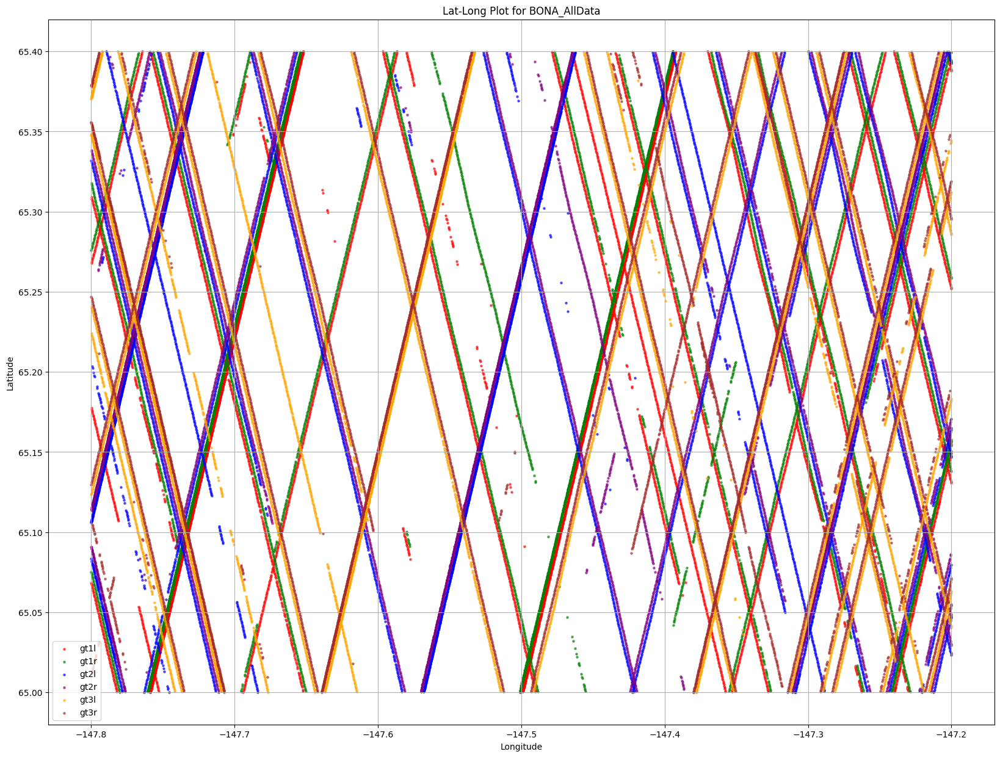

C:\Users\allen\AppData\Local\Temp\ipykernel_1340\4187645451.py:148: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(plot_filename)
C:\Users\allen\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


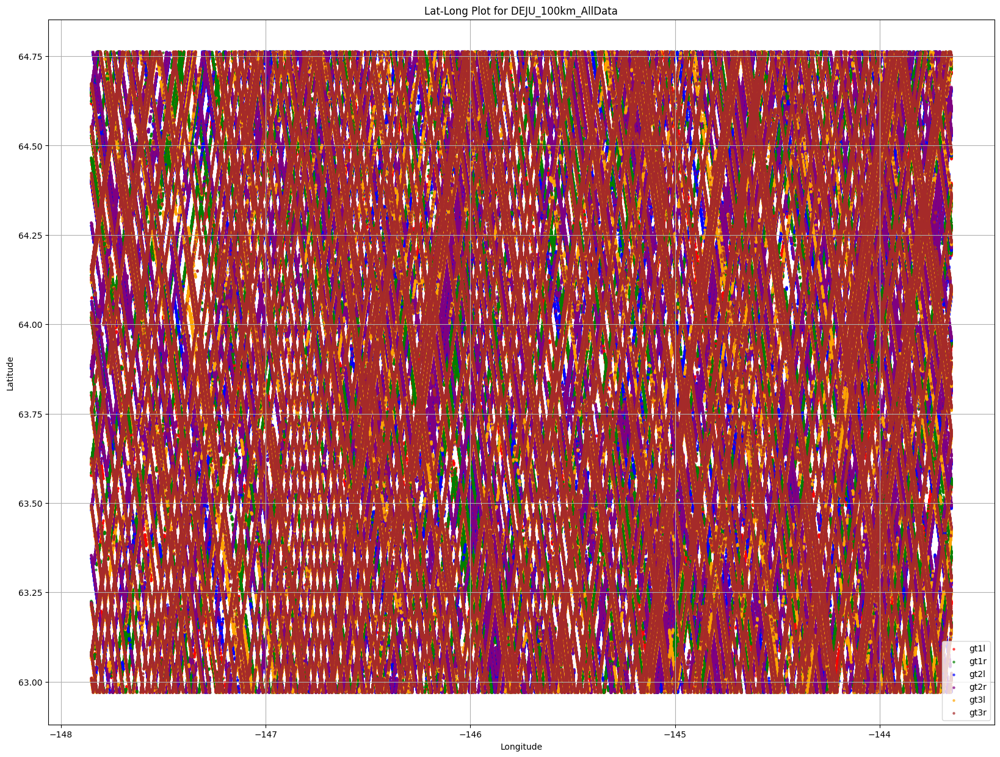

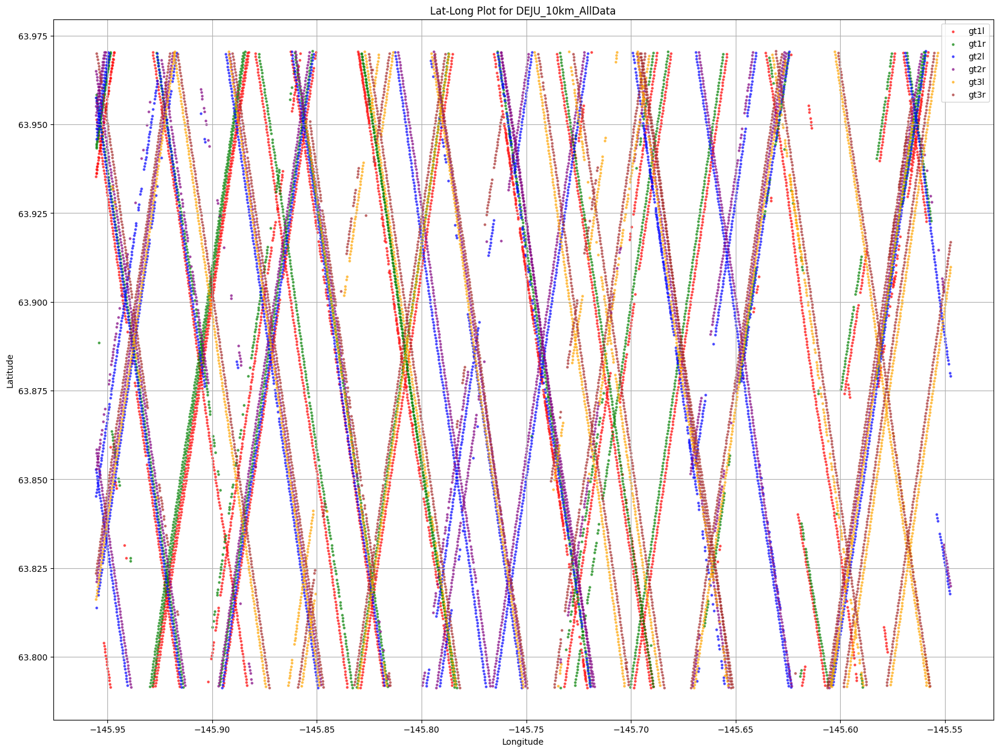

C:\Users\allen\AppData\Local\Temp\ipykernel_1340\4187645451.py:148: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(plot_filename)
C:\Users\allen\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


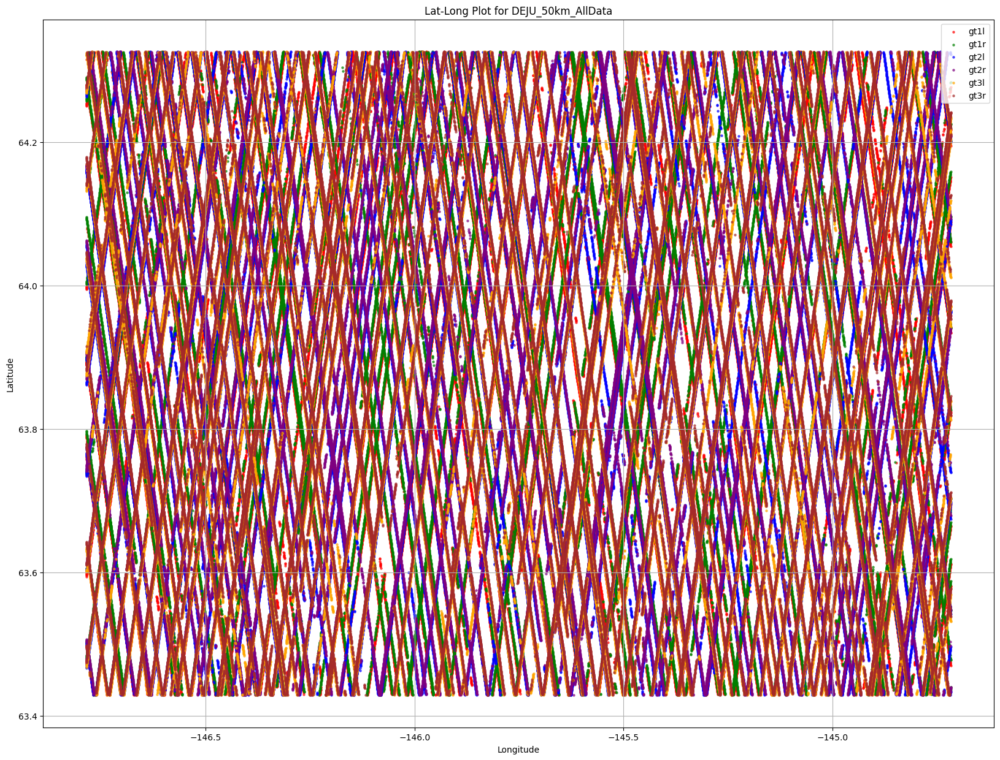

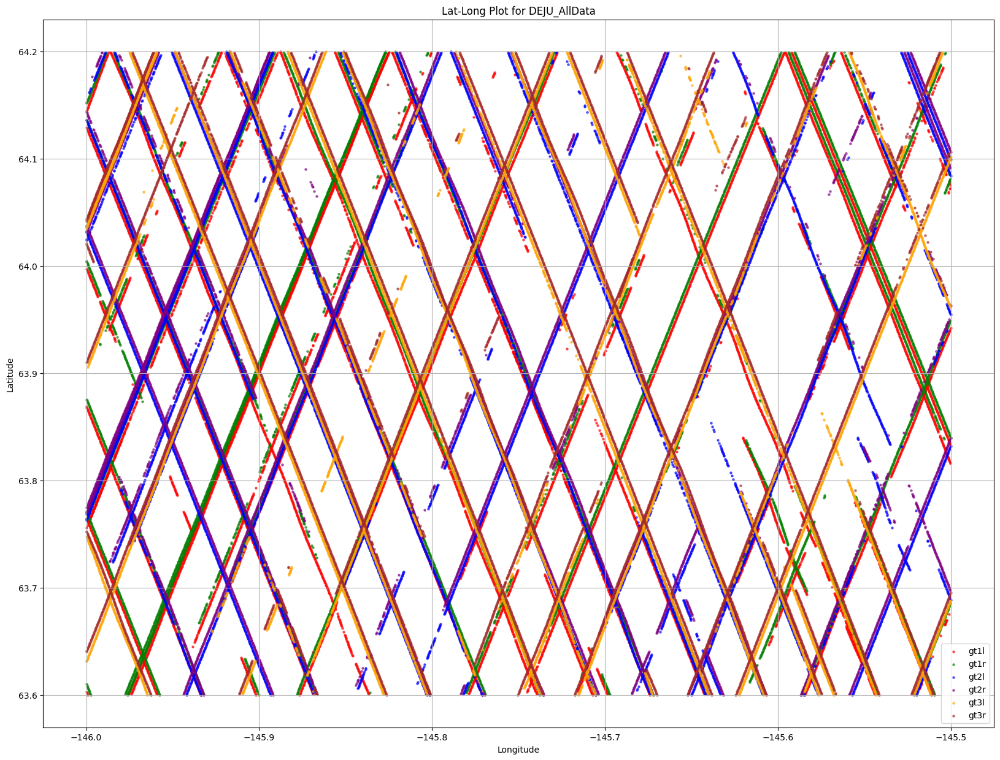

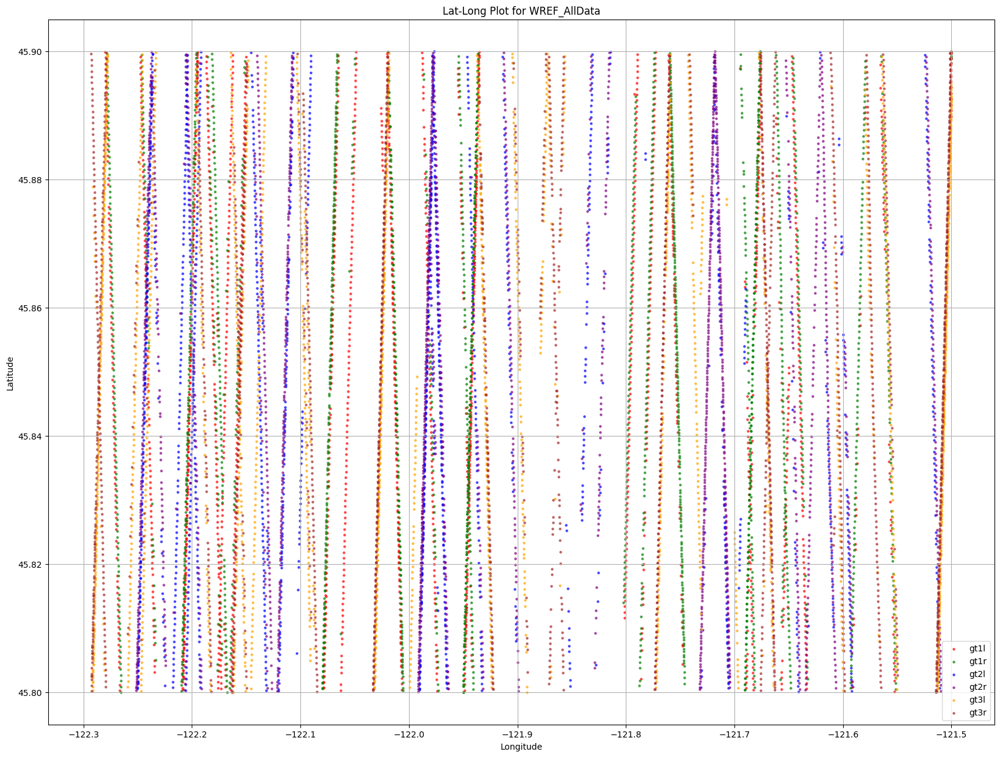

In [ ]:
plot_and_save_unique_data(output_path, save_path)

In [ ]:
import math
import pyproj

def latlon_to_utm(lat, lon):
    # Determine the UTM zone number
    utm_zone = int((lon + 180) // 6) + 1
    
    # Determine if the location is in the northern or southern hemisphere
    hemisphere = '326' if lat >= 0 else '327'
    
    # Define the EPSG code for the UTM zone
    epsg_code = f"EPSG:{hemisphere}{utm_zone:02d}"
    
    # Define the coordinate reference systems
    wgs84 = pyproj.CRS("EPSG:4326")  # WGS84 coordinate system
    utm_crs = pyproj.CRS(epsg_code)  # UTM coordinate system for the calculated zone

    # Create a transformer object
    transformer = pyproj.Transformer.from_crs(wgs84, utm_crs, always_xy=True)

    # Transform the coordinates
    easting, northing = transformer.transform(lon, lat)
    
    return easting, northing, utm_zone, epsg_code

# WREF: lat, long = 45.82049, -121.95191, UTM: 10, EPSG: 32610
# DEJU: lat, long = 63.88112, -145.75136, UTM: 6, EPSG: 32606
# BONA: lat, long = 65.15401, -147.50258, UTM: 6, EPSG: 32606

lat, lon = 45.82049, -121.95191
lat1, lon1 = 63.88112, -145.75136
lat2, lon2 = 65.15401, -147.50258

easting, northing, utm_zone, epsg_code = latlon_to_utm(lat, lon)
print(f"Latitude: {lat}, Longitude: {lon}")
print(f"UTM Zone: {utm_zone}")
print(f"Easting: {easting}, Northing: {northing}")
print(f"EPSG Code: {epsg_code}")

easting1, northing1, utm_zone1, epsg_code1 = latlon_to_utm(lat1, lon1)
print(f"Latitude: {lat1}, Longitude: {lon1}")
print(f"UTM Zone: {utm_zone1}")
print(f"Easting: {easting1}, Northing: {northing1}")
print(f"EPSG Code: {epsg_code1}")

easting2, northing2, utm_zone2, epsg_code2 = latlon_to_utm(lat2, lon2)
print(f"Latitude: {lat2}, Longitude: {lon2}")
print(f"UTM Zone: {utm_zone2}")
print(f"Easting: {easting2}, Northing: {northing2}")
print(f"EPSG Code: {epsg_code2}")

Latitude: 45.82049, Longitude: -121.95191
UTM Zone: 10
Easting: 581417.9548771823, Northing: 5074637.094436773
EPSG Code: EPSG:32610
Latitude: 63.88112, Longitude: -145.75136
UTM Zone: 6
Easting: 561330.0607755512, Northing: 7084367.215688075
EPSG Code: EPSG:32606
Latitude: 65.15401, Longitude: -147.50258
UTM Zone: 6
Easting: 476436.7394563845, Northing: 7225712.648358242
EPSG Code: EPSG:32606


612
{'date': '20190110', 'beam': 1, 'start': 363689, 'end': 363694, 'forest_type': 'Closed Forest, unknown/mixed', 'latitude': 65.38774, 'longitude': -147.20009, 'photon_id': 363689}
{'date': '20190110', 'beam': 1, 'start': 363694, 'end': 363699, 'forest_type': 'Closed Forest, unknown/mixed', 'latitude': 65.388626, 'longitude': -147.20033, 'photon_id': 363689}
{'date': '20190110', 'beam': 1, 'start': 363699, 'end': 363704, 'forest_type': 'Closed Forest, unknown/mixed', 'latitude': 65.38952, 'longitude': -147.20058, 'photon_id': 363689}
{'date': '20190110', 'beam': 1, 'start': 363704, 'end': 363709, 'forest_type': 'Closed Forest, unknown/mixed', 'latitude': 65.39041, 'longitude': -147.20082, 'photon_id': 363689}
{'date': '20190110', 'beam': 1, 'start': 363709, 'end': 363714, 'forest_type': 'Closed Forest, unknown/mixed', 'latitude': 65.391304, 'longitude': -147.20107, 'photon_id': 363689}
{'date': '20190110', 'beam': 1, 'start': 363714, 'end': 363719, 'forest_type': 'Closed Forest, unkn

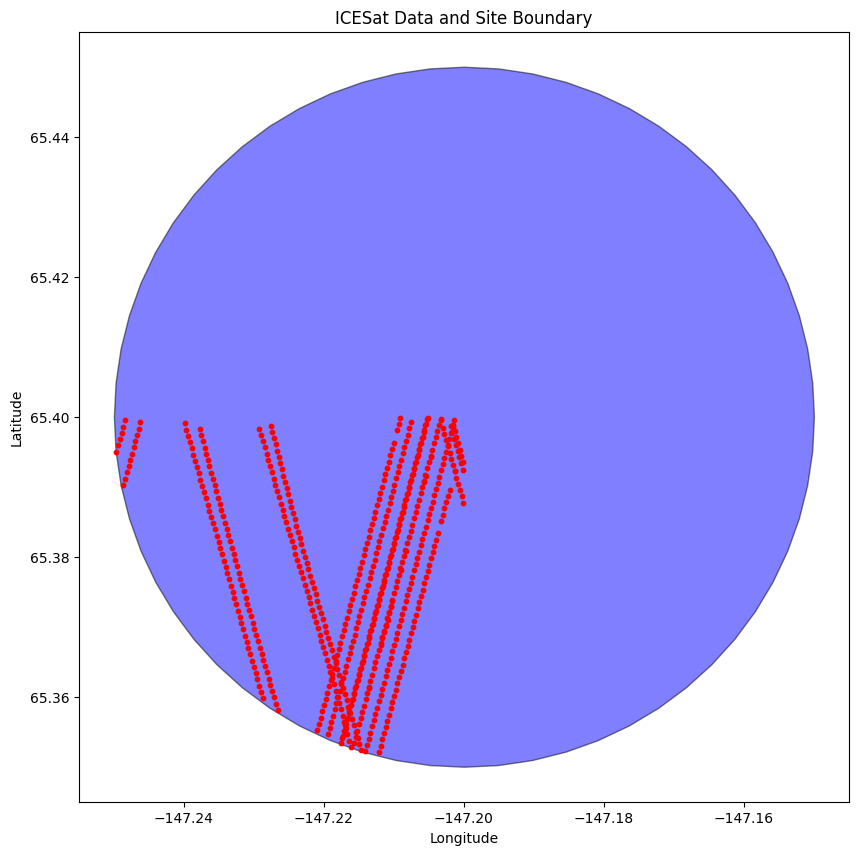

In [ ]:
import os
import h5py
from datetime import datetime
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

def get_date_from_filename(filename):
    parts = filename.split('_')
    date_str = parts[2][:8]  # Get the first 8 characters of the third part
    date = datetime.strptime(date_str, '%Y%m%d').strftime('%Y%m%d')
    return date

def extract_beam_info(file_path):
    beam_info = []

    # Open the HDF5 file
    with h5py.File(file_path, 'r') as f:
        # Iterate over all beam groups
        for beam_idx, beam in enumerate(['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r'], start=1):
            if f"{beam}/land_segments" in f:
                # Extract segment IDs
                segment_ids = f[f"{beam}/land_segments/segment_id_beg"][:]
                latitudes = f[f"{beam}/land_segments/latitude"][:]
                longitudes = f[f"{beam}/land_segments/longitude"][:]
                canopy_counts = f[f"{beam}/land_segments/canopy/segment_cover"][:]
                # photon_id = f[f"{beam}/signal_photons/ph_segment_id"][:]

                for i, segment_id in enumerate(segment_ids):
                    if i < len(segment_ids) - 1:  # Ensure there is a next segment for 'end'
                        segment_info = {
                            'beam': beam_idx,
                            'start': segment_id,
                            'end': segment_ids[i + 1],
                            'latitude': latitudes[i],
                            'longitude': longitudes[i],
                            'canopy_count': canopy_counts[i],
                            # 'photon_id' : photon_id[i]
                        }
                        beam_info.append(segment_info)
    
    return beam_info

def create_segments_list(base_dir, site_boundary_gdf):
    segments = []
    forest_type_mapping = {
        'Closed Forest, unknown/mixed': [20, 30],  # Example for mapping
        'Closed Forest, evergreen needle leaf': [126]  # Example for  mapping
    }

    # Get list of all HDF5 files in the directory
    file_names = [f for f in os.listdir(base_dir) if f.endswith('.h5')]
    
    for file_name in file_names:
        file_path = os.path.join(base_dir, file_name)
        date = get_date_from_filename(file_name)
        beam_info = extract_beam_info(file_path)
        
        for info in beam_info:
            point = Point(info['longitude'], info['latitude'])
            if site_boundary_gdf.contains(point).any():  # Check if the point is within the site boundary
                forest_type = 'Closed Forest, unknown/mixed'
                for ft, codes in forest_type_mapping.items():
                    if info['canopy_count'] in codes:
                        forest_type = ft
                        break
                segment = {
                    'date': date,
                    'beam': info['beam'],
                    'start': info['start'],
                    'end': info['end'],
                    'forest_type': forest_type,
                    'latitude': info['latitude'],
                    'longitude': info['longitude'],
                    # 'photon_id': info['photon_id']

                }
                segments.append(segment)
    
    return segments

def plot_segments_and_site(segments, site_boundary_gdf):
    fig, ax = plt.subplots(figsize=(10, 10))
    site_boundary_gdf.plot(ax=ax, color='blue', alpha=0.5, edgecolor='black')
    
    for segment in segments:
        plt.scatter(segment['longitude'], segment['latitude'], color='red', s=10)
    
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('ICESat Data and Site Boundary')
    plt.show()

# Data
base_dir = '/data/shared/rsdata/lidar/icesat/BONA'

# Create the site boundary GeoDataFrame
site_boundary_gdf = gpd.GeoDataFrame({
    'site': ['Site'],
    'geometry': [Point(-147.2, 65.4).buffer(0.05)]  # Buffer to create a circular area around the site
})

# Create segments list within the site boundary
BONA_segments = create_segments_list(BONA_folder, site_boundary_gdf)
print(len(BONA_segments))

# Print the result
for segment in BONA_segments:
    print(segment)

# Plot the segments and site
plot_segments_and_site(BONA_segments, site_boundary_gdf)

In [8]:
from geopy.distance import geodesic

def get_bounding_box(h5_file_path):
    # Extract data from the file
    df = extract_data_from_file(h5_file_path)

    # Extract latitude and longitude into a separate DataFrame
    lat_lon_df = df[['latitude', 'longitude']]

    # Calculate the bounding box
    min_lat = lat_lon_df['latitude'].min()
    max_lat = lat_lon_df['latitude'].max()
    min_lon = lat_lon_df['longitude'].min()
    max_lon = lat_lon_df['longitude'].max()

    return (min_lat, max_lat, min_lon, max_lon)

def get_length_and_width_in_meters(h5_file_path):
    min_latitude, max_latitude, min_longitude, max_longitude = get_bounding_box(h5_file_path)
    
    length_meters = geodesic((min_latitude, min_longitude), (max_latitude, min_longitude)).meters
    width_meters = geodesic((min_latitude, min_longitude), (min_latitude, max_longitude)).meters
    
    return length_meters, width_meters

def process_h5_files_in_folder(folder_path):
    h5_files = glob.glob(os.path.join(folder_path, '*.h5'))
    results = []

    for h5_file in h5_files:
        length, width = get_length_and_width_in_meters(h5_file)
        results.append((os.path.basename(h5_file), length, width))
    
    return results

In [13]:
BONA_cam_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_cam/'
BONA_10km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_10km/'
BONA_50km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_50km/'
BONA_100km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_100km/'

DEJU_cam_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/BONA_cam/'
DEJU_10km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU_10km/'
DEJU_50km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU_50km/'
DEJU_100km_folder = 'C:/Users/allen/OneDrive/Desktop/Work/data/icesat/DEJU_100km/'


BONA_cam_results = process_h5_files_in_folder(BONA_cam_folder)

for file_name, length, width in BONA_cam_results:
    print(f"File: {file_name} - Length: {length:.2f} meters, Width: {width:.2f} meters")

# BONA_10km_results = process_h5_files_in_folder(BONA_10km_folder)

# for file_name, length, width in BONA_10km_results:
#     print(f"File: {file_name} - Length: {length:.2f} meters, Width: {width:.2f} meters")

# BONA_50km_results = process_h5_files_in_folder(BONA_50km_folder)

# for file_name, length, width in BONA_50km_results:
#     print(f"File: {file_name} - Length: {length:.2f} meters, Width: {width:.2f} meters")

# BONA_100km_results = process_h5_files_in_folder(BONA_100km_folder)

# for file_name, length, width in BONA_100km_results:
#     print(f"File: {file_name} - Length: {length:.2f} meters, Width: {width:.2f} meters")

# DEJU_cam_results = process_h5_files_in_folder(DEJU_cam_folder)

# for file_name, length, width in DEJU_cam_results:
#     print(f"File: {file_name} - Length: {length:.2f} meters, Width: {width:.2f} meters")


File: processed_ATL08_20181226100839_13560105_005_01.h5 - Length: 5969.78 meters, Width: 3992.57 meters
File: processed_ATL08_20190626012811_13560305_005_01.h5 - Length: 4775.49 meters, Width: 3698.56 meters
File: processed_ATL08_20190911091348_11500403_005_01.h5 - Length: 5467.91 meters, Width: 651.13 meters
File: processed_ATL08_20190924210806_13560405_005_01.h5 - Length: 5908.54 meters, Width: 3976.79 meters
File: processed_ATL08_20191224164753_13560505_005_01.h5 - Length: 5968.93 meters, Width: 4019.09 meters
File: processed_ATL08_20200511213710_07080703_005_01.h5 - Length: 5968.08 meters, Width: 747.94 meters
File: processed_ATL08_20200922034713_13560805_005_01.h5 - Length: 5979.14 meters, Width: 4015.53 meters
File: processed_ATL08_20210208083639_07081003_005_01.h5 - Length: 5974.89 meters, Width: 3996.19 meters
File: processed_ATL08_20210322190656_13561005_005_01.h5 - Length: 5987.65 meters, Width: 4020.54 meters
File: processed_ATL08_20210621144647_13561105_005_01.h5 - Length: 